# บทที่ 1 - Machine Learning คืออะไร?

[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/ai-builders/curriculum/blob/main/notebooks/01_ml_what.ipynb)

ในบทเรียนนี้เราจะเรียนรู้ว่า Artificial Intelligence (AI), Machine Learning (ML) และ Deep Learning (DL) คืออะไร เหมือนกันหรือแตกต่างกันอย่างไร เราจะเรียนรู้ส่วนประกอบของระบบ machine learning และวิธีการเทรน machine learning model ด้วยตัวอย่างจำแนกรูปภาพอาหารไทย 48 ชนิดจากชุดข้อมูล [FoodyDudy](https://github.com/GemmyTheGeek/FoodyDudy) หลังจากนั้นเราจะเห็นว่าส่วนประกอบและวิธีการเทรนนี้ถูกใช้กับข้อมูลชนิดอื่นๆ เช่น ข้อความ (texts) และตาราง (tabular data) ได้อย่างไรบ้าง

Checkpoint ท้ายบทประกอบด้วยคำถามชวนคิดเกี่ยวกับบทเรียนและสิ่งที่ควรเตรียมพร้อมสำหรับทำโครงงานในสัปดาห์ของบทที่ 1 นี้

บทเรียนนี้ปรับแต่งและเพิ่มเติมจาก [fastai Practical Deep Learning for Coders v4 part1 - Lesson 1](https://course.fast.ai/videos/?lesson=1) เพื่อให้เหมาะกับโครงการ AI Builders



## ติดตั้ง Package ที่ต้องใช้งาน

In [1]:
#ลง package ที่ต้องใช้; รันแค่ครั้งเดียวก็พอ

#pytorch ignite
!pip install -q --pre pytorch-ignite==0.5.0.dev20230325

#fastai
!pip install -q fastbook==0.0.29

#pythainlp
!pip install -q pythainlp==5.1.0

#transformers
!pip install -q transformers==4.49.0

#datasets
!pip install -q datasets==3.4.1

#accelerate
!pip install -q accelerate==1.1.0

#autogluon
!pip install -q autogluon==1.2

exit() #reset runtime เพื่อให้ package ใช้งานได้อย่างถูกต้อง

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 264.6/264.6 kB 14.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 107.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 82.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 49.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 13.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 6.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 88.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 719.8/719.8 kB 34.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
import torch
torch.set_default_device('cuda')
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

## เริ่มทำ ML กัน! Image Classification with fastai and Resnet

ผลงาน [โมเดลจำแนกรูปอาหารไทย 48 ประเภท](https://www.facebook.com/groups/dsbkkgroup/posts/1733262050179128/) โดย [@GemmyTheGeek](https://github.com/GemmyTheGeek) ศิษย์เก่าโครงการ AI Builders (Class of 2021) เราจะเทรน ML model ด้วยข้อมูลรูปภาพอาหารไทยขนาด 224 x 224 pixels จำนวน 240 รูปต่อเมนูอาหาร (รวม 240 x 48 = 11,520 รูป) และทดสอบบน mini validation set ที่มีข้อมูล 5 รูปต่อเมนูอาหาร (รวม 5 x 48 = 240 รูป) ว่ามีความแม่นยำ (accuracy) แค่ไหน

โมเดลที่ดีที่สุดของ [@GemmyTheGeek](https://github.com/GemmyTheGeek) มีความแม่นยำถึง 97% หลังผ่านการปรับแต่ง สามารถทดลองใช้ได้[ที่นี่](https://huggingface.co/spaces/cstorm125/foodydudy_for_lesson1/)

### FoodyDudy - ชุดข้อมูลอาหารไทย 48 ประเภท

In [ ]:
#download รูปอาหารจาก FoodyDudy
!git clone https://github.com/GemmyTheGeek/FoodyDudy.git
!rm -r FoodyDudy/images/valid_mini
!mkdir FoodyDudy/images/valid_mini

#สร้าง valid mini เพื่อความเร็วในการทำ validation
import glob
import shutil
import os

valid_folders = glob.glob('FoodyDudy/images/valid/*')
valid_fnames = []
for folder in valid_folders:
    valid_fnames += glob.glob(f'{folder}/*')[:5]
for i in range(48):
    os.mkdir(f'FoodyDudy/images/valid_mini/{str(i).zfill(2)}')
for fname in valid_fnames:
    shutil.copyfile(fname, f'FoodyDudy/images/valid_mini/{fname.split("/")[-2]}/{fname.split("/")[-1]}')

Cloning into 'FoodyDudy'...
remote: Enumerating objects: 14727, done.
remote: Counting objects: 100% (18/18), done.
remote: Compressing objects: 100% (11/11), done.
remote: Total 14727 (delta 7), reused 18 (delta 7), pack-reused 14709 (from 1)
Receiving objects: 100% (14727/14727), 645.40 MiB | 14.86 MiB/s, done.
Resolving deltas: 100% (56/56), done.
Updating files: 100% (14465/14465), done.
rm: cannot remove 'FoodyDudy/images/valid_mini': No such file or directory


<img src=https://github.com/GemmyTheGeek/FoodyDudy/raw/main/47thaifood.png width="500px">


In [ ]:
#เปลี่ยน label จากตัวเลขเป็นชื่อภาษาอังกฤษ เพื่อความง่ายในการดูผล
food_d = [
 'green_curry', 'tepo_curry', 'liang_curry', 'taohoo_moosup', 'mara_yadsai',
 'masaman', 'orange_curry', 'cashew_chicken', 'omelette', 'sunny_side_up',
 'palo_egg', 'sil_egg', 'nun_banana', 'kua_gai', 'cabbage_fish_sauce',
 'river_prawn', 'shrimp_ob_woonsen', 'kanom_krok', 'mango_sticky_rice', 'kao_kamoo',
 'kao_klook_kapi', 'kaosoi', 'kao_pad', 'kao_pad_shrimp', 'chicken_rice',
 'kao_mok_gai', 'tom_ka_gai', 'tom_yum_kung', 'tod_mun', 'poh_pia',
 'pak_boong_fai_daeng', 'padthai', 'pad_krapao', 'pad_si_ew', 'pad_fakthong',
 'eggplant_stirfry', 'pad_hoi_lai', 'foithong', 'panaeng', 'yum_tua_ploo',
 'yum_woonsen', 'larb_moo', 'pumpkin_custard', 'sakoo_sai_moo', 'somtam',
 'moopoing','satay', 'hor_mok'
]

for i in range(48):
    os.rename(f"FoodyDudy/images/train/{str(i).zfill(2)}", f"FoodyDudy/images/train/{str(i).zfill(2)}_{food_d[i]}")
for i in range(48):
    os.rename(f"FoodyDudy/images/valid_mini/{str(i).zfill(2)}", f"FoodyDudy/images/valid_mini/{str(i).zfill(2)}_{food_d[i]}")

### เทรนโมเดลด้วย fastai

[fastai](https://docs.fast.ai/) เป็น package สำหรับเทรน deep learning model ที่สร้างต่อยอดบน [Pytorch](https://pytorch.org/) ทำให้เราสามารถเทรน deep learning model ที่มีประสิทธิภาพสูงได้ง่ายและรวดเร็ว

In [ ]:
from fastbook import *

เนื่องจากเรามีข้อมูลรูปภาพกว่า 1 หมื่นรูป เราจึงไม่สามารถโหลดรูปภาพทั้งหมดเข้าไปใน memory ได้ในครั้งเดียว เราจึงต้องอาศัย dataloader เพื่อทำการโหลดข้อมูลเข้าไปทีละ batch ในที่นี้คือ batch ละ 64 รูป

`DataBlock` เป็น class สำหรับสร้าง dataloader เพื่อส่งรูปให้กับโมเดลของ fastai

In [ ]:
dblock = DataBlock(
    blocks=(ImageBlock, CategoryBlock), #x - image; y - single class
    get_items=get_image_files, #get image
    splitter=GrandparentSplitter(valid_name='valid_mini'), #use parent folder as train-valid split
    get_y=parent_label, #use parent folder as label
    batch_tfms=aug_transforms(size=224)
    )
dls = dblock.dataloaders('FoodyDudy/images/', bs=64)

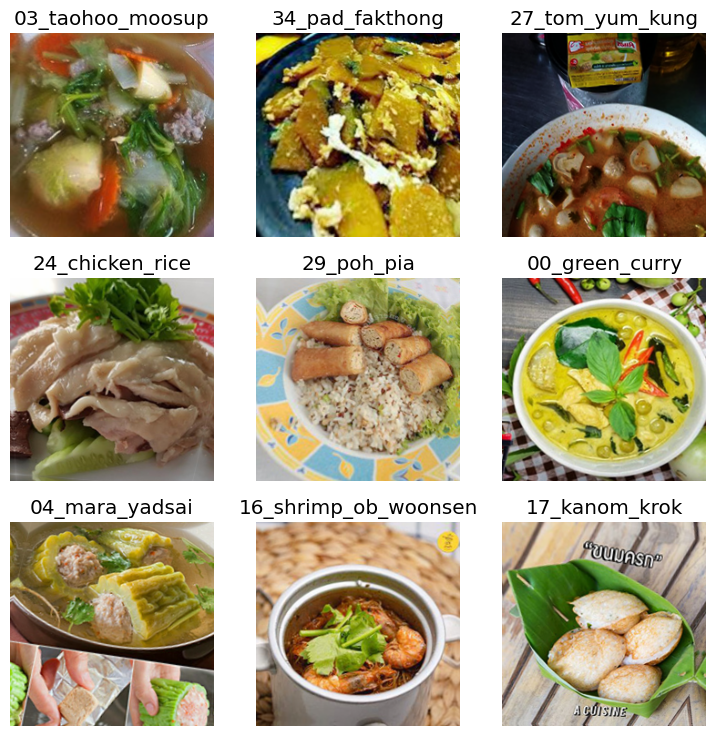

In [ ]:
dls.train.show_batch(max_n=9,nrows=3)

สร้าง trainer ชื่อ `learn` และโหลด pretrained weights ชื่อ `resnet34` เพื่อทำการเทรนโมเดล; pretrained weights คือ weights ที่ถูกเทรนเพื่อจำแนกรูปภาพสิ่งของ 1,000 ประเภทจากชุดข้อมูล [ImageNet](https://www.image-net.org/) กว่า 1.2 ล้านรูป เรานำโมเดลนี้มาปรับจูน (finetune) เพื่อใช้จำแนกรูปที่เราต้องการ เช่น รูปอาหารไทย 48 ชนิดแทน

วิธีการนี้เรียกว่า [transfer learning](https://en.wikipedia.org/wiki/Transfer_learning) กล่าวคือนำโมเดลที่ถูกเทรนเพื่อทำ task หนึ่ง (จำแนกรูปภาพสิ่งของทั่วไป, ทำนายคำต่อไปในประโยค ฯลฯ) มาปรับจูนเพื่อทำ task อื่นๆ (จำแนกรูปอาหารไทย, จำแนกชนิดประโยค ฯลฯ) เป็นเทคนิคที่นิยมใช้กันอย่างแพร่หลายใน deep learning โดยเฉพาะกับข้อมูลรูปภาพและข้อความ

เราเทรนโมเดล (เฉพาะส่วนจำแนกรูปภาพอาหารไทย) ด้วยรูปทั้งหมด 1 ครั้ง (1 epoch) ด้วย learning rate = 0.002 เราจะวัดผลด้วย metric คือ accuracy (ความแม่นยำ; ถ้าทายถูกได้ 1 ทายผิดได้ 0 และหาค่าเฉลี่ย) ได้ความแม่นยำกว่า 75% ในเวลาไม่ถึง 3 นาทีซึ่งถือว่าไม่เลวเลยสำหรับการจำแนกรูปภาพ 48 ประเภท (ถ้าเดาสุ่มมีความแม่นยำ 1/48 = 2.08%)

ศัพท์เทคนิคทั้งหมดนี้คุณอาจจะยังไม่ต้องเข้าใจทั้งหมดตอนนี้ แต่จะได้เรียนรู้ในบทเรียนต่อๆไป

In [ ]:
learn = cnn_learner(dls, resnet34, metrics=accuracy)
learn.fine_tune(epochs=0, freeze_epochs=1, base_lr=2e-3)

/usr/local/lib/python3.11/dist-packages/fastai/vision/learner.py:303: UserWarning: `cnn_learner` has been renamed to `vision_learner` -- please update your code
  warn("`cnn_learner` has been renamed to `vision_learner` -- please update your code")
Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth
100%|██████████| 83.3M/83.3M [00:00<00:00, 195MB/s]


epoch,train_loss,valid_loss,accuracy,time
0,2.119446,0.839737,0.741667,00:52


ดูผลการทำนายคร่าวๆใน validation set ว่าทำนายผิดจากอะไรเป็นอะไรบ้าง

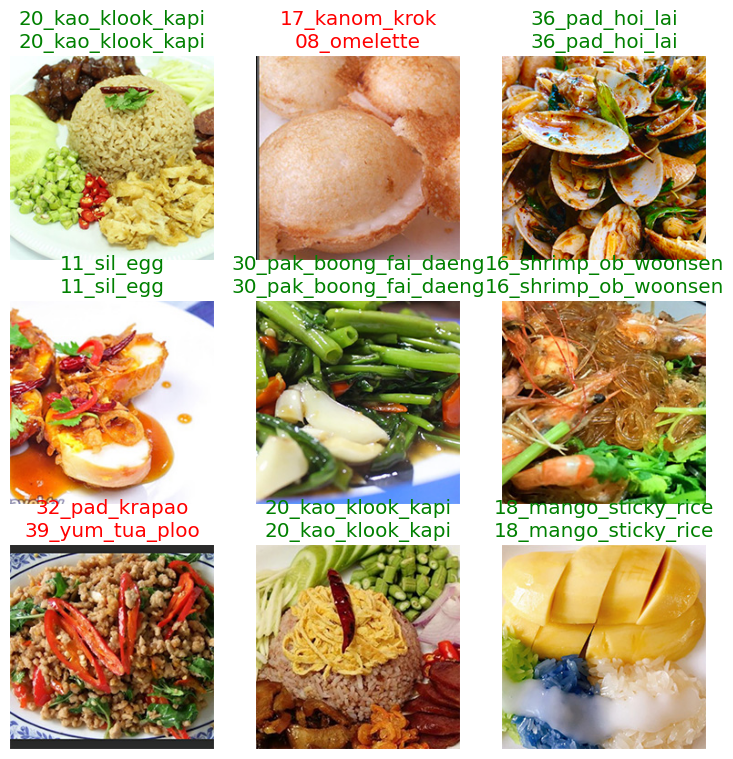

In [ ]:
learn.show_results() #true label - บน; prediction - ล่าง

ดู confusion matrix ของผลการทำนายใจ validation set ทั้งหมด `Actual` คือ label ที่แท้จริง `Predicted` คือ label ที่โมเดลทำนาย

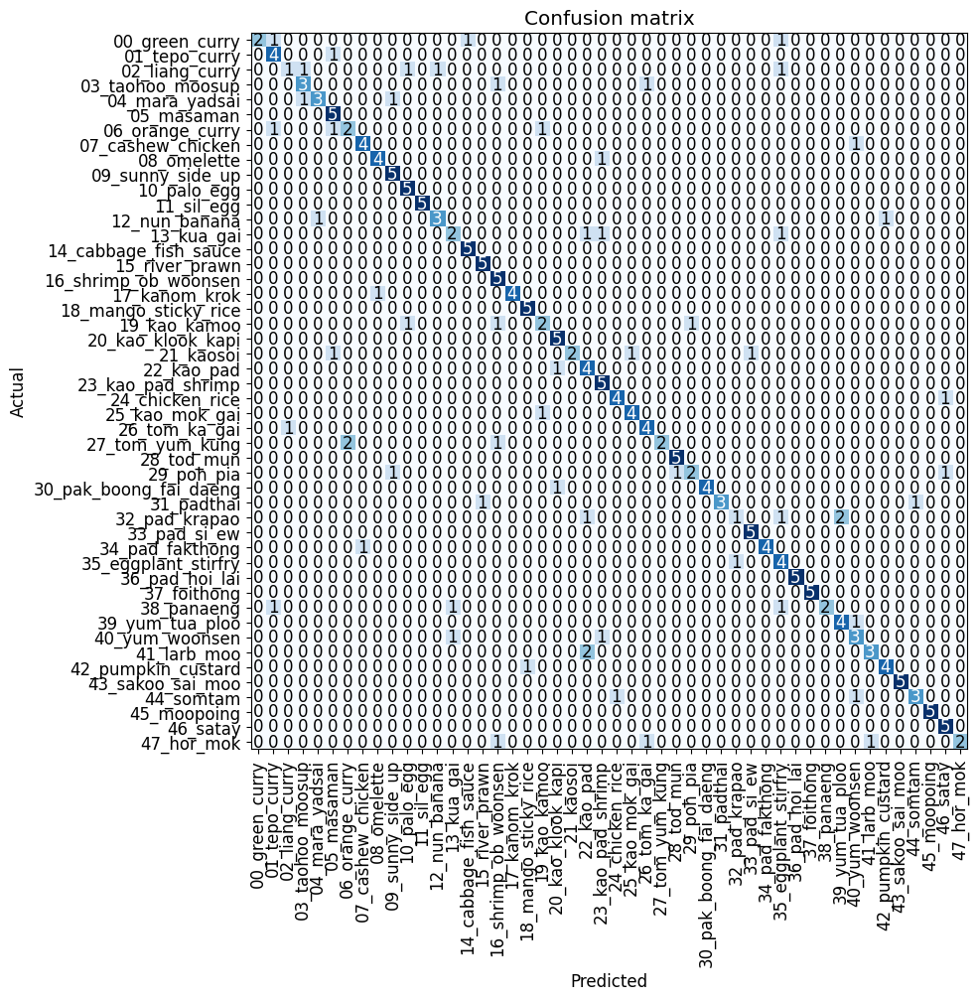

In [ ]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix(figsize=(10,10))

Metric (ตัวชี้วัด) สำหรับ classification อื่นๆ เช่น [precision, recall, f1-score](https://en.wikipedia.org/wiki/Precision_and_recall)

In [ ]:
interp.print_classification_report()

                        precision    recall  f1-score   support

        00_green_curry       1.00      0.40      0.57         5
         01_tepo_curry       0.57      0.80      0.67         5
        02_liang_curry       0.50      0.20      0.29         5
      03_taohoo_moosup       0.60      0.60      0.60         5
        04_mara_yadsai       0.75      0.60      0.67         5
            05_masaman       0.62      1.00      0.77         5
       06_orange_curry       0.50      0.40      0.44         5
     07_cashew_chicken       0.80      0.80      0.80         5
           08_omelette       0.80      0.80      0.80         5
      09_sunny_side_up       0.71      1.00      0.83         5
           10_palo_egg       0.71      1.00      0.83         5
            11_sil_egg       1.00      1.00      1.00         5
         12_nun_banana       0.75      0.60      0.67         5
            13_kua_gai       0.50      0.40      0.44         5
 14_cabbage_fish_sauce       0.83      

## Artificial Intelligence (AI), Machine Learning (ML), Deep Learning (DL) คืออะไร-เหมือน/ต่างกันอย่างไร

AI มีนิยามที่กว้างและหลากหลายเป็นอย่างยิ่ง หากอ้างอิงหนังสือ [Artificial Intelligence: A Modern Approach](http://aima.cs.berkeley.edu/) จะหมายถึงระบบที่คิดหรือทำอย่างมนุษย์หรืออย่างมีเหตุผล หรืออาจจะกล่าวได้ว่าเป็นระบบที่คิดและทำอย่างมี "[สติปัญญา](https://en.wikipedia.org/wiki/Intelligence)" ซึ่งเป็นคำที่มีนิยามกว้างและหลากหลายอีกเช่นกัน

ในทางปฏิบัติของโครงการ AI Builders เราจะนิยาม AI ว่าเป็นระบบที่คิดและทำอย่างชาญฉลาด (โดยจงใจไม่ให้นิยามอันแน่ชัดกับความ "ชาญฉลาด" นี้) โดยอาศัย "กฎ" เช่น `ถ้าเกิด X แล้วควรจะทำ Y` กฎเหล่านี้จะถูกสร้างโดยมนุษย์กำหนดขึ้นเองหรือให้เครื่องจักรเรียนรู้ขึ้นเองจากข้อมูลก็ได้

ML คือ AI ชนิดหนึ่งเกิดขึ้นในกรณีที่กฎถูกเรียนรู้ขึ้นมาจากข้อมูลในอดีตด้วยเทคนิคทางสถิต เช่น จากการสังเกตข้อมูลซื้อขายของลูกค้าในอดีต เราค้นพบกฎว่า `ถ้าเป็นวันเสาร์-อาทิตย์ ยอดขายจะเพิ่มขึ้น` เป็นต้น

DL คือเทคนิค ML ที่ใช้ Neural Networks หลายชั้นเป็นสถาปัตยกรรมในการเรียนรู้กฎเหล่านี้

<img src=https://github.com/ai-builders/curriculum/raw/main/images/ai_ml_dl.png width="700px">

<img src=https://github.com/ai-builders/curriculum/raw/main/images/ai_definitions.png width="700px">

## ML ต่างจาก AI รูปแบบอื่นอย่างไร

เราอาจจะแบ่ง AI คร่าวๆเป็น 2 ประเภทคือ

1. **Rule-based Systems** ที่กฎ (Rules) ถูกกำหนดขึ้นโดยมนุษย์ เมื่อเราใส่ Input และ Rules ที่เรากำหนดเข้าไปคำนวณ (Computation) ก็จะได้ Output ออกมา

2. **Machine Learning Systems** ที่กฎถูกเรียนรู้ขึ้นมาจาก Input และ Output ในอดีต เช่น พฤติกรรมลูกค้าในอดีต, รูปภาพหรือข้อความที่ถูก label ด้วยมนุษย์มาก่อน, ราคาทรัพย์สินในอดีต เป็นต้น เพื่อให้ได้ Rules ขึ้นมา โดยส่วนใหญ่เรียก Rules นี้ว่า ML Models หลังจากนั้นจึงทำ Rules ไปใช้งานกับข้อมูลชุดใหม่ในรูปแบบเดียวกับ Rule-based Systems

<img src=https://github.com/ai-builders/curriculum/raw/main/images/rules_vs_ml.png width="700px">

## ML Model เรียนรู้ได้อย่างไร

ตัวอย่าง `Training Loop` การจำแนกรูป `ส้มตำ` หรือ `ไม่ส้มตำ`

1. เตรียมข้อมูล `Inputs` (ตัวอย่าง; รูปภาพ) และ `Labels` (`ส้มตำ` หรือ `ไม่ส้มตำ`) ใส่เข้าไปใน `Dataloader`; `Dataloader` ทำหน้าที่ส่งข้อมูลให้ทีละ batch (จำนวนตัวอย่างต่อ batch เรียกว่า batch size)
2. ส่งข้อมูล Inputs ใน batch นั้นไปคำนวนด้วย `Weights` เพื่อให้ได้ `Predictions`; `Weights` เปรียบเสมือนตัวเลขค่าสัมประสิทธิ์ในสมการ เช่น ในสมการ `y = 2.5x^2 - 0.5x + 0.2` ค่า `Weights` คือ 2.5, -0.5  และ 0.2 (`x` คือ `Inputs` และ `y` คือ `Predictions`)
3. คำนวณ `Loss` ของ batch ด้วย `Loss Function`; `Loss Function` มีหน้าที่หา "ความแตกต่าง" ระหว่าง `Predictions` (คำทำนายจากโมเดลว่ามีโอกาสเป็น `ส้มตำ` แค่ไหน) และ `Labels` (ความเป็นจริงว่าเป็น `ส้มตำ` หรือ `ไม่ส้มตำ`) ค่า `Loss` คือผลลัพธ์ ยิ่ง `Loss` สูงก็ยิ่งแปลว่าคำทำนายของเราผิดมาก-เยอะ
4. หลังจากได้ `Loss` ของแต่ละ batch แล้วเราก็คำนวณ `Gradients` ด้วยวิธี Backpropagation และนำ `Gradients` ไปให้ `Optimizer` ทำการ update `Weights`; การอัพเดทในที่นี้กล่าวง่ายๆคือการเปลี่ยนตัวเลขในสมการ เช่น จาก `y = 0.1x^2 - 0.1x + 0.1 เป็น `y` = 2.5x^2 - 0.5x + 0.2` เป็นต้น โดยการทำเช่นนี้โดยทั่วไปจะทำให้โมเดลมี `Weights` ที่ทำนายได้แม่นยำมากขึ้นและส่งผลให้ `Loss` ลดลงเรื่อยๆ

ขั้นตอนการกระทำ 1.-4. สำหรับข้อมูล 1 batch เรียกว่า 1 iteration; หากทำจนครบทุก batch ของข้อมูลที่มี 1 ครั้งเรียกว่า 1 epoch เช่น หากเรามีข้อมูล 100 รูป, batch size = 5 รูป, เราจะมีทั้งหมด 20 batches, 1 epoch ของเราจะประกอบด้วย 20 iterations เครื่องมือการเทรน ML สมัยใหม่ส่วนใหญ่จะมี class สำหรับช่วยทำให้ `Training Loop` สะดวกขึ้นเรียกว่า `Trainer` และ class สำหรับเก็บข้อมูลระหว่างเทรนเรียกว่า `Logger` เพิ่มมาอีกด้วย



คุณเห็นความแตกต่างอะไรบ้างใน `Training Loop` ด้านล่าง?

**ก่อนเทรน**

<img src=https://github.com/ai-builders/curriculum/raw/main/images/training_loop50.png width="700px">

**หลังเทรน**

<img src=https://github.com/ai-builders/curriculum/raw/main/images/training_loop70.png width="700px">

## Metric and Splits - โมเดลทำได้ดีแค่ไหน-แค่ไหนเรียกดี

ค่า `Loss` สามารถบอกได้ว่า `Predictions` "แตกต่าง" จาก `Labels` มากแค่ไหน แต่ในการใช้งานจริงคุณไม่สามารถไปบอกคนอื่นว่า "โมเดลจำแนกสิ่งของ 10 ชนิดของผมมี `Loss` อยู่ที่ 0.234" แล้วให้เขาเข้าใจว่ามันดีหรือไม่ดี เราจึงต้องมี `Metric` (ตัวชี้วัด) ที่เหมาะสมกับงาน (ภาษาทางเทคนิคนิยมเรียกว่า `task`) ต่างๆ เช่น หากเป็นการจำแนกรูปภาพสิ่งของ (`image classification task`) เราอาจจะใช้ `Metric` เป็น accuracy, [precision, recall, หรือ f1-score](https://en.wikipedia.org/wiki/Precision_and_recall) หากเป็นการทำนายตัวเลข (`regression task`) เราอาจจะใช้ [mean squared error](https://en.wikipedia.org/wiki/Mean_squared_error), [mean absolute error](https://en.wikipedia.org/wiki/Mean_absolute_error), หรือ [mean absolute percentage error](https://en.wikipedia.org/wiki/Mean_absolute_percentage_error)

<img src=https://github.com/ai-builders/curriculum/raw/main/images/train_valid_test_splits.png width="500px">

โดยทั่วไปแล้ว เราจะแบ่งชุดข้อมูลเป็น 3 splits และคำนวณค่า metric บน `validation` และ `test` sets

1. `train` - ชุดข้อมูลที่ป้อนให้โมเดลเพื่อทำการเรียนรู้ตาม `Training Loop` ("แบบฝึกหัด")
2. `validation` - ชุดข้อมูลสำหรับคำนวณ metric เพื่อเลือกโมเดลที่ดีที่สุด เพราะในความเป็นจริงเราอาจจะเทรนโมเดลหลากหลายสถาปัตยกรรมหรือ hyperparameters; metric ที่ถูกคำนวณบน `validation` จึงใช้สำหรับเปรียบเทียบโมเดลที่ดีที่สุด ("ข้อสอบ pre-test จากโรงเรียนกวดวิชา")
3. `test` - ชุดข้อมูลสำหรับคำนวณ metric ของโมเดลที่เราเลือกแล้วว่าดีที่สุด เปรียบเสมือนตัวชี้วัดว่าโมเดลของเราจะทำได้ดีแค่ไหนในโลกแห่งความเป็นจริง; ชุดข้อมูลนี้จะถูกรันเพียงครั้งเดียวเท่านั้นในการทำโครงงาน ด้วยโมเดลที่ดีที่สุดที่เราเลือกมาจาก `validation` ("ข้อสอบจริง")

เหตุผลที่เราแบ่งชุดข้อมูล `train` กับ `validation` ออกจากกันเนื่องจากหากโมเดลได้รับการเทรนด้วยตัวอย่างใดตัวอย่างหนึ่งแล้ว มีความเป็นไปได้สูงที่โมเดลจะ "จดจำคำตอบ" ของตัวอย่างนั้นๆได้ เปรียบเสมือนหากเรานำข้อสอบปลายภาคมาให้นักเรียนทำเป็นแบบฝึกหัด นักเรียนย่อมมีโอกาสทำได้ดีเกือบเต็มแทบทุกคน แต่ไม่ใช่เพราะนักเรียนได้เรียนรู้สิ่งที่เราต้องการ แต่แค่เพราะจำคำตอบได้จากแบบฝึกหัดนั่นเอง

เหตุผลที่เราแบ่งชุดข้อมูล `validation` กับ `test` ออกจากกันเนื่องจาก หากเราใช้ข้อมูลชุดเดียวกันในการทดสอบโมเดลหลายรูปแบบ เรามีโอกาสที่จะจงใจปรับจูนโมเดลให้เหมาะกับ "ข้อสอบจริง" ได้โดยตั้งใจหรือไม่ตั้งใจ เราจึงปรับจูนโมเดลของเราด้วย `validation` แล้วจึงนำโมเดลที่ดีที่สุดไป "สอบจริง" ด้วย `test`

เพราะฉะนั้นเวลาเราแบ่ง `train`, `validation` และ `test` splits เราต้องทำให้มั่นใจว่าไม่มีตัวอย่างเดียวกันหลุดไปใน set อื่น เช่น ในการทำ face recognition ไม่ควรมีรูปคนๆเดียวกันในมากกว่า 1 set, หากทำ time series forecasting เรียงข้อมูลจากเก่าสุดไปใหม่สุดใน `train`, `validation` และ `test` เพื่อไม่ให้โมเดลเห็นข้อมูลจากอนาคต, หากทำ product recommendation ไม่ควรมีข้อมูลของลูกค้าคนเดียวกันในมากกว่า 1 set เพราะจะทำให้เราเดาว่าเขาเป็นลูกค้าประเภทไหนได้ด้วยข้อมูลที่ไม่ควรเห็น ฯลฯ ทั้งนี้ขึ้นอยู่กับวิจารณญาณของผู้สร้างโมเดล



## Image Classification with Pytorch and Resnet

เรามาลองจำแนกรูปอาหารไทย 48 ประเภทกันอีกครั้ง โดยครั้งนี้เราจะค่อยๆสร้างส่วนประกอบต่างๆขึ้นเองด้วย [Pytorch](https://pytorch.org/) และ [Pytorch Ignite](https://pytorch.org/ignite/index.html)

In [ ]:
#import packages
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tqdm.auto import tqdm

import torch
import torch.nn.functional as F
from torch import nn
from torch.optim import AdamW
from torch.utils.data import DataLoader

from torchvision import datasets
import torchvision.transforms as T
from torchvision import models

from ignite.engine import Engine, Events, create_supervised_evaluator, create_supervised_trainer
from ignite.metrics import Accuracy, Loss

try:
    from tensorboardX import SummaryWriter
except ImportError:
    try:
        from torch.utils.tensorboard import SummaryWriter
    except ImportError:
        raise RuntimeError(
            "This module requires either tensorboardX or torch >= 1.2.0. "
            "You may install tensorboardX with command: \n pip install tensorboardX \n"
            "or upgrade PyTorch using your package manager of choice (pip or conda).")

### Metric

In [ ]:
probs = torch.tensor([[0.4, 0.6],
                      [0.1, 0.9],
                      [0.9, 0.1]], dtype=torch.float)
preds = probs.argmax(1)
targets = torch.tensor([0,1,0])

print(probs)
print(preds)
print(targets)

tensor([[0.4000, 0.6000],
        [0.1000, 0.9000],
        [0.9000, 0.1000]])
tensor([1, 1, 0])
tensor([0, 1, 0])


In [ ]:
#accuracy
(preds==targets).float().mean()

tensor(0.6667)

### Datasets and Dataloaders

In [ ]:
train_dir = 'FoodyDudy/images/train'
valid_dir = 'FoodyDudy/images/valid_mini'
batch_size = 256

#image augmentations; fastai ทำให้เราอัตโนมัติ แต่เราสามารถกำหนดเองได้ด้วยว่าเราอยากได้อะไรบ้าง
train_transform = T.Compose([
    T.Resize(224),
    T.TrivialAugmentWide(),
    T.ToTensor(),
    # T.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))
])

valid_transform = T.Compose([
    T.Resize(224),
    T.ToTensor(),
    # T.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))
])

#dataset
train_ds = datasets.ImageFolder(train_dir, transform=train_transform)
valid_ds = datasets.ImageFolder(valid_dir, transform=valid_transform)

#dataloader
train_dl = DataLoader(train_ds, batch_size=batch_size, num_workers=0, shuffle=True)
valid_dl = DataLoader(valid_ds, batch_size=batch_size, num_workers=0, shuffle=False)

classes = train_ds.classes
n_classes = len(classes)

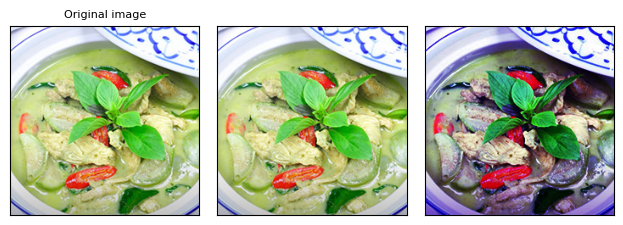

In [ ]:
from PIL import Image
import glob

#helper functions from https://pytorch.org/vision/master/auto_examples/plot_transforms.html#sphx-glr-auto-examples-plot-transforms-py
def plot(imgs, with_orig=True, row_title=None, **imshow_kwargs):
    if not isinstance(imgs[0], list):
        # Make a 2d grid even if there's just 1 row
        imgs = [imgs]

    num_rows = len(imgs)
    num_cols = len(imgs[0]) + with_orig
    fig, axs = plt.subplots(nrows=num_rows, ncols=num_cols,
                            squeeze=False,)
    for row_idx, row in enumerate(imgs):
        row = [orig_img] + row if with_orig else row
        for col_idx, img in enumerate(row):
            ax = axs[row_idx, col_idx]
            ax.imshow(np.asarray(img), **imshow_kwargs)
            ax.set(xticklabels=[], yticklabels=[], xticks=[], yticks=[])

    if with_orig:
        axs[0, 0].set(title='Original image')
        axs[0, 0].title.set_size(8)
    if row_title is not None:
        for row_idx in range(num_rows):
            axs[row_idx, 0].set(ylabel=row_title[row_idx])

    plt.tight_layout()

test_images = glob.glob('FoodyDudy/images/test/00/*')
i = np.random.randint(0,len(test_images))
orig_img = Image.open(test_images[i])

augmenter = T.TrivialAugmentWide()
imgs = [augmenter(orig_img) for _ in range(2)]
plot(imgs)

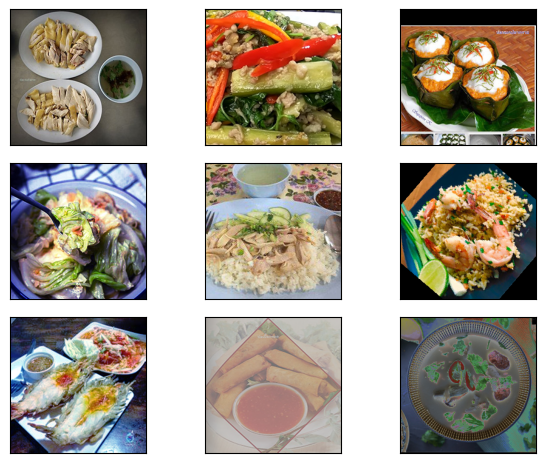

In [ ]:
#helper functions adapted from https://pytorch.org/vision/master/auto_examples/plot_transforms.html#sphx-glr-auto-examples-plot-transforms-py
def plot_row(imgs, img_per_row = 3):
    num_cols = img_per_row
    num_rows = len(imgs) // num_cols
    fig, axs = plt.subplots(nrows=num_rows, ncols=num_cols, squeeze=False)
    for row_idx, row in enumerate(imgs):
        ax = axs[row_idx // num_cols, row_idx % num_cols]
        ax.imshow(row.permute(1,2,0))
        ax.set(xticklabels=[], yticklabels=[], xticks=[], yticks=[])
    plt.tight_layout()

sample_imgs = next(iter(train_dl))
plot_row(sample_imgs[0][:9])

### Architecture and Weights

เราเลือกใช้ Architecture ชื่อ [resnet](https://pytorch.org/vision/stable/models.html) รูปแบบที่มี 50 layers (`resnet50`) ที่ถูก pretrain (เทรนมาก่อนหน้า) ด้วยรูปสิ่งของทั่วไปกว่า 1 ล้านรูป ([ImageNet](https://www.image-net.org/))

In [ ]:
backbone = models.resnet50(pretrained=True)
backbone

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 200MB/s]


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

### Loss

เราเลือกใช้ Loss Function ที่เรียกว่า [Cross Entropy Loss](https://pytorch.org/docs/stable/generated/torch.nn.CrossEntropyLoss.html)

In [ ]:
#ลองปรับ probs และ targets ดูว่าทำให้ loss เปลี่ยนไปอย่างไรบ้าง
probs = torch.tensor([[0.4, 0.6],
                      [0.1, 0.9],
                      [0.9, 0.1]], dtype=torch.float)
preds = probs.argmax(1)
targets = torch.tensor([0,1,0])

print(probs)
print(preds)
print(targets)

tensor([[0.4000, 0.6000],
        [0.1000, 0.9000],
        [0.9000, 0.1000]])
tensor([1, 1, 0])
tensor([0, 1, 0])


In [ ]:
loss_function = nn.CrossEntropyLoss()
loss_function(input = probs,
              target = targets).item()

0.5134467482566833

In [ ]:
#accuracy
(preds==targets).float().mean()

tensor(0.6667)

### Optimizer

เราใช้ [AdamW](https://pytorch.org/docs/stable/generated/torch.optim.AdamW.html) เป็น Optimizer

In [ ]:
optimizer = torch.optim.AdamW(backbone.parameters(), lr=3e-4)
optimizer

AdamW (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0003
    maximize: False
    weight_decay: 0.01
)

### Architecture as Class

เราเปลี่ยน layer สุดท้ายของ resnet50 จากการทำนายสิ่งของ 1,000 ประเภทเป็นการทำนายอาหาร 48 ประเภท

In [ ]:
class FoodResNet(nn.Module):
    def __init__(self, n_classes=48):
        super(FoodResNet, self).__init__()
        # ใช้สถาปัตยกรรม resnet50; เปลี่ยน layer สุดท้ายเป็นการทำนายอาหาร 48 classes
        self.backbone = models.resnet50(pretrained=True)
        for param in self.backbone.parameters():
            param.requires_grad = False

        #เพิ่งแค่ตรงนี้
        self.backbone.fc = torch.nn.Linear(self.backbone.fc.in_features, n_classes)

    def forward(self, x):
        preds = self.backbone(x)
        return preds

### Training Loop

นำทุกสิ่งเข้ามารวมกันแล้วเริ่มการเทรน!

#### Putting It All Together

In [ ]:
train_dir = 'FoodyDudy/images/train'
valid_dir = 'FoodyDudy/images/valid_mini'
batch_size = 512

#image augmentations
train_transform = T.Compose([
    T.Resize(224),
    T.TrivialAugmentWide(), #image augmentation จากงาน https://arxiv.org/abs/2103.10158
    T.ToTensor(),
    # T.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))
])

valid_transform = T.Compose([
    T.Resize(224),
    T.ToTensor(),
    # T.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))
])

#dataset
train_ds = datasets.ImageFolder(train_dir, transform=train_transform)
valid_ds = datasets.ImageFolder(valid_dir, transform=valid_transform)

#dataloader
train_dl = DataLoader(train_ds, batch_size=batch_size, num_workers=0, shuffle=True)
valid_dl = DataLoader(valid_ds, batch_size=batch_size, num_workers=0, shuffle=False)

classes = train_ds.classes
n_classes = len(classes)

In [ ]:
#ใส่ model และ input ใน gpu (ถ้ามี) ไม่ก็ cpu
device = 'cuda' if torch.cuda.is_available() else 'cpu'

#architecture
model = FoodResNet(n_classes=len(train_ds.classes)).to(device)

#loss
loss_function = nn.CrossEntropyLoss()

#optimizer
optimizer = torch.optim.AdamW(model.parameters(), lr=1e-3)

#trainer
trainer = create_supervised_trainer(model, optimizer, loss_function, device=device)

#metric
val_metrics = {"accuracy": Accuracy(), "ce_loss": Loss(loss_function)}
evaluator = create_supervised_evaluator(model, metrics=val_metrics, device=device)

#### Logger

Logger สำหรับบันทึก Metric ระหว่างการเทรน

In [ ]:
#logger
writer = SummaryWriter(log_dir='logs')
train_log_interval = 1 #1 iteration = 1 batch = example จำนวนเท่า batch size
eval_log_interval = len(train_dl) #1 epoch = จำนวน example ทั้งหมด / batch size = วนครบทุก example 1 รอบ

pbar = tqdm(initial=0,
            leave=False,
            total=len(train_dl),
            desc=f"epoch {0} - loss: {0:.4f} - lr: {0:.4f}")

#ทุก X iteration, บันทึก training loss
@trainer.on(Events.ITERATION_COMPLETED(every=train_log_interval))
def log_training_loss(engine):
    lr = optimizer.param_groups[0]["lr"]
    pbar.desc = f"epoch {engine.state.epoch} - train loss: {engine.state.output:.4f} - lr: {lr:.4f}"
    pbar.update(train_log_interval)
    writer.add_scalar("training/loss", engine.state.output, engine.state.iteration)

#ทุก epoch, บันทึก training loss, accuracy
@trainer.on(Events.ITERATION_COMPLETED(every=eval_log_interval))
def log_training_results(engine):
    evaluator.run(train_dl)
    metrics = evaluator.state.metrics
    avg_accuracy = metrics["accuracy"]
    avg_loss = metrics["ce_loss"]
    tqdm.write(
        f"train results - epoch: {engine.state.epoch} avg accuracy: {avg_accuracy:.2f} avg loss: {avg_loss:.2f}"
    )
    writer.add_scalar("training/avg_loss", avg_loss, engine.state.iteration)
    writer.add_scalar("training/avg_accuracy", avg_accuracy, engine.state.iteration)

#ทุก epoch, บันทึก validation loss, accuracy
@trainer.on(Events.ITERATION_COMPLETED(every=eval_log_interval))
def log_validation_results(engine):
    evaluator.run(valid_dl)
    metrics = evaluator.state.metrics
    avg_accuracy = metrics["accuracy"]
    avg_loss = metrics["ce_loss"]
    tqdm.write(
        f"valid results - epoch: {engine.state.epoch} avg accuracy: {avg_accuracy:.2f} avg loss: {avg_loss:.2f}"
    )
    writer.add_scalar("valdation/avg_loss", avg_loss, engine.state.iteration)
    writer.add_scalar("valdation/avg_accuracy", avg_accuracy, engine.state.iteration)
    pbar.n = pbar.last_print_n = 0

epoch 0 - loss: 0.0000 - lr: 0.0000:   0%|          | 0/23 [00:00<?, ?it/s]

#### Train the Model

In [ ]:
trainer.run(train_dl, max_epochs=3)
writer.close()

train results - epoch: 1 avg accuracy: 0.47 avg loss: 2.58
valid results - epoch: 1 avg accuracy: 0.50 avg loss: 2.40
train results - epoch: 2 avg accuracy: 0.62 avg loss: 1.84
valid results - epoch: 2 avg accuracy: 0.68 avg loss: 1.58
train results - epoch: 3 avg accuracy: 0.67 avg loss: 1.51
valid results - epoch: 3 avg accuracy: 0.76 avg loss: 1.22


### Evaluation

ดู Log ของการเทรนด้วย `tensorboard`

In [ ]:
%reload_ext tensorboard
%tensorboard --logdir logs/ --host 0.0.0.0

<IPython.core.display.Javascript object>

## Text Classification with HuggingFace and WangchanBERTa

ใช้โมเดลที่ดีที่สุด ทำ NLP task ที่ง่ายที่สุดคือการแยกข้อความ social media ว่าเป็น positive, neutral, negative หรือ question ด้วยชุดข้อมูล [wisesight_sentiment](https://github.com/PyThaiNLP/wisesight-sentiment) ผล benchmark ที่ดีที่สุดของชุดข้อมูลนี้ทำโดย [Wangchanberta](https://medium.com/airesearch-in-th/wangchanberta-%E0%B9%82%E0%B8%A1%E0%B9%80%E0%B8%94%E0%B8%A5%E0%B8%9B%E0%B8%A3%E0%B8%B0%E0%B8%A1%E0%B8%A7%E0%B8%A5%E0%B8%9C%E0%B8%A5%E0%B8%A0%E0%B8%B2%E0%B8%A9%E0%B8%B2%E0%B9%84%E0%B8%97%E0%B8%A2%E0%B8%97%E0%B8%B5%E0%B9%88%E0%B9%83%E0%B8%AB%E0%B8%8D%E0%B9%88%E0%B9%81%E0%B8%A5%E0%B8%B0%E0%B8%81%E0%B9%89%E0%B8%B2%E0%B8%A7%E0%B8%AB%E0%B8%99%E0%B9%89%E0%B8%B2%E0%B8%97%E0%B8%B5%E0%B9%88%E0%B8%AA%E0%B8%B8%E0%B8%94%E0%B9%83%E0%B8%99%E0%B8%82%E0%B8%93%E0%B8%B0%E0%B8%99%E0%B8%B5%E0%B9%89-d920c27cd433) ที่ micro-averaged F1 ที่ 76.19

เพื่อประหยัดเวลาในตัวอย่างนี้เราจะเทรนด้วย training set เพียงแค่ 5,000 ตัวอย่างจากกว่า 20,000 ข้อความ

<img src=https://github.com/ai-builders/curriculum/raw/main/images/wangchanberta_results.png width="700px">



In [ ]:
import torch
torch.set_default_device('cuda')
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [ ]:
"""
Preprocessing for thai2transformers
"""
from typing import Collection, Callable
from functools import partial
import re
import html
from pythainlp.tokenize import word_tokenize

_TK_UNK, _TK_REP, _TK_WREP, _TK_URL, _TK_END = "<unk> <rep> <wrep> <url> </s>".split()

SPACE_SPECIAL_TOKEN = "<_>"

# str->str rules
def fix_html(text: str) -> str:
    """
        List of replacements from html strings in `test`. (code from `fastai`)
        :param str text: text to replace html string
        :return: text where html strings are replaced
        :rtype: str
        :Example:
            >>> fix_html("Anbsp;amp;nbsp;B @.@ ")
            A & B.
    """
    re1 = re.compile(r"  +")
    text = (
        text.replace("#39;", "'")
        .replace("amp;", "&")
        .replace("#146;", "'")
        .replace("nbsp;", " ")
        .replace("#36;", "$")
        .replace("\\n", "\n")
        .replace("quot;", "'")
        .replace("<br />", "\n")
        .replace('\\"', '"')
        .replace(" @.@ ", ".")
        .replace(" @-@ ", "-")
        .replace(" @,@ ", ",")
        .replace("\\", " \\ ")
    )
    return re1.sub(" ", html.unescape(text))


def replace_url(text: str) -> str:
    """
        Replace url in `text` with TK_URL (https://stackoverflow.com/a/6041965)
        :param str text: text to replace url
        :return: text where urls  are replaced
        :rtype: str
        :Example:
            >>> replace_url("go to https://github.com")
            go to <url>
    """
    URL_PATTERN = r"(http|ftp|https)://([\w_-]+(?:(?:\.[\w_-]+)+))([\w.,@?^=%&:/~+#-]*[\w@?^=%&/~+#-])?"
    return re.sub(URL_PATTERN, _TK_URL, text)


def rm_brackets(text: str) -> str:
    """
        Remove all empty brackets and artifacts within brackets from `text`.
        :param str text: text to remove useless brackets
        :return: text where all useless brackets are removed
        :rtype: str
        :Example:
            >>> rm_brackets("hey() whats[;] up{*&} man(hey)")
            hey whats up man(hey)
    """
    # remove empty brackets
    new_line = re.sub(r"\(\)", "", text)
    new_line = re.sub(r"\{\}", "", new_line)
    new_line = re.sub(r"\[\]", "", new_line)
    # brakets with only punctuations
    new_line = re.sub(r"\([^a-zA-Z0-9ก-๙]+\)", "", new_line)
    new_line = re.sub(r"\{[^a-zA-Z0-9ก-๙]+\}", "", new_line)
    new_line = re.sub(r"\[[^a-zA-Z0-9ก-๙]+\]", "", new_line)
    # artifiacts after (
    new_line = re.sub(r"(?<=\()[^a-zA-Z0-9ก-๙]+(?=[a-zA-Z0-9ก-๙])", "", new_line)
    new_line = re.sub(r"(?<=\{)[^a-zA-Z0-9ก-๙]+(?=[a-zA-Z0-9ก-๙])", "", new_line)
    new_line = re.sub(r"(?<=\[)[^a-zA-Z0-9ก-๙]+(?=[a-zA-Z0-9ก-๙])", "", new_line)
    # artifacts before )
    new_line = re.sub(r"(?<=[a-zA-Z0-9ก-๙])[^a-zA-Z0-9ก-๙]+(?=\))", "", new_line)
    new_line = re.sub(r"(?<=[a-zA-Z0-9ก-๙])[^a-zA-Z0-9ก-๙]+(?=\})", "", new_line)
    new_line = re.sub(r"(?<=[a-zA-Z0-9ก-๙])[^a-zA-Z0-9ก-๙]+(?=\])", "", new_line)
    return new_line


def replace_newlines(text: str) -> str:
    """
        Replace newlines in `text` with spaces.
        :param str text: text to replace all newlines with spaces
        :return: text where all newlines are replaced with spaces
        :rtype: str
        :Example:
            >>> rm_useless_spaces("hey whats\n\nup")
            hey whats  up
    """

    return re.sub(r"[\n]", " ", text.strip())


def rm_useless_spaces(text: str) -> str:
    """
        Remove multiple spaces in `text`. (code from `fastai`)
        :param str text: text to replace useless spaces
        :return: text where all spaces are reduced to one
        :rtype: str
        :Example:
            >>> rm_useless_spaces("oh         no")
            oh no
    """
    return re.sub(" {2,}", " ", text)

def replace_spaces(text: str, space_token: str = SPACE_SPECIAL_TOKEN) -> str:
    """
        Replace spaces with _
        :param str text: text to replace spaces
        :return: text where all spaces replaced with _
        :rtype: str
        :Example:
            >>> replace_spaces("oh no")
            oh_no
    """
    return re.sub(" ", space_token, text)


def replace_rep_after(text: str) -> str:
    """
    Replace repetitions at the character level in `text`
    :param str text: input text to replace character repetition
    :return: text with repetitive tokens removed.
    :rtype: str
    :Example:
        >>> text = "กาาาาาาา"
        >>> replace_rep_after(text)
        'กา'
    """

    def _replace_rep(m):
        c, cc = m.groups()
        return f"{c}"

    re_rep = re.compile(r"(\S)(\1{3,})")
    return re_rep.sub(_replace_rep, text)


def replace_wrep_post(toks: Collection[str]) -> Collection[str]:
    """
    Replace reptitive words post tokenization;
    fastai `replace_wrep` does not work well with Thai.
    :param Collection[str] toks: list of tokens
    :return: list of tokens where repetitive words are removed.
    :rtype: Collection[str]
    :Example:
        >>> toks = ["กา", "น้ำ", "น้ำ", "น้ำ", "น้ำ"]
        >>> replace_wrep_post(toks)
        ['กา', 'น้ำ']
    """
    previous_word = None
    rep_count = 0
    res = []
    for current_word in toks + [_TK_END]:
        if current_word == previous_word:
            rep_count += 1
        elif (current_word != previous_word) & (rep_count > 0):
            res += [previous_word]
            rep_count = 0
        else:
            res.append(previous_word)
        previous_word = current_word
    return res[1:]


# combine them together
def process_transformers(
    text: str,
    pre_rules: Collection[Callable] = [
        fix_html,
        rm_brackets,
        replace_newlines,
        rm_useless_spaces,
        replace_spaces,
        replace_rep_after,
    ],
    tok_func: Callable = word_tokenize,
    post_rules: Collection[Callable] = [replace_wrep_post],
) -> str:
    text = text.lower()
    for rule in pre_rules:
        text = rule(text)
    toks = tok_func(text)
    for rule in post_rules:
        toks = rule(toks)
    return "".join(toks)

"""
Metric for thai2transformers
"""
from sklearn.metrics import f1_score, accuracy_score, precision_recall_fscore_support, classification_report
def classification_metrics(pred, pred_labs=False):
    labels = pred.label_ids
    preds = pred.predictions if pred_labs else pred.predictions.argmax(-1)
    precision_macro, recall_macro, f1_macro, _ = precision_recall_fscore_support(labels, preds, average="macro")
    precision_micro, recall_micro, f1_micro, _ = precision_recall_fscore_support(labels, preds, average="micro")
    acc = accuracy_score(labels, preds)
    return {
        'accuracy': acc,
        'f1_micro': f1_micro,
        'precision_micro': precision_micro,
        'recall_micro': recall_micro,
        'f1_macro': f1_macro,
        'precision_macro': precision_macro,
        'recall_macro': recall_macro,
        'nb_samples': len(labels)
    }


In [ ]:
import pandas as pd
from datasets import load_dataset, DatasetDict
from sklearn.metrics import accuracy_score, precision_recall_fscore_support
from transformers import AutoTokenizer
from transformers import AutoModelForSequenceClassification, TrainingArguments, Trainer

In [ ]:
#load dataset
train_ds, valid_ds, test_ds = load_dataset('wisesight_sentiment', split=['train[:5000]','validation','test'])
dataset = DatasetDict({'train': train_ds, 'validation': valid_ds, 'test': test_ds})
dataset = dataset.map(lambda examples: {'labels': examples['category']}, batched=True)
num_labels = len(set(dataset['train']['labels']))
dataset

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


README.md:   0%|          | 0.00/12.1k [00:00<?, ?B/s]

train-00000-of-00001.parquet:   0%|          | 0.00/2.58M [00:00<?, ?B/s]

validation-00000-of-00001.parquet:   0%|          | 0.00/286k [00:00<?, ?B/s]

test-00000-of-00001.parquet:   0%|          | 0.00/327k [00:00<?, ?B/s]

Generating train split:   0%|          | 0/21628 [00:00<?, ? examples/s]

Generating validation split:   0%|          | 0/2404 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/2671 [00:00<?, ? examples/s]

Map:   0%|          | 0/500 [00:00<?, ? examples/s]

Map:   0%|          | 0/2404 [00:00<?, ? examples/s]

Map:   0%|          | 0/2671 [00:00<?, ? examples/s]

DatasetDict({
    train: Dataset({
        features: ['texts', 'category', 'labels'],
        num_rows: 500
    })
    validation: Dataset({
        features: ['texts', 'category', 'labels'],
        num_rows: 2404
    })
    test: Dataset({
        features: ['texts', 'category', 'labels'],
        num_rows: 2671
    })
})

In [ ]:
#ตัวอย่างข้อความ
#0 positive; 1 neutral; 2 negative; 3 question
pd.DataFrame(dataset['train'].shuffle()[:10])[['labels','texts']]

,labels,texts
0,2,น้ำตบ เซรั่ม โอเลย์ แล้วก็กันแดดค่ะ เว้นระยะเว...
1,2,ลีโอแดกละปวดหัวสัส
2,0,ไปกันเก้บตังก่อน555
3,0,จะกินหรอจ๊ะ
4,1,24 ปี คะ #innisfree #lazada
5,2,ผมโทรไปถามแล้วเห็นถามกันเยอะเรื่องลิขสิทธิ์ห้า...
6,1,สุกี้ MK ค่ะ กินเต็มที่มาก เพราะยังไม่ถึงกำหนด...
7,2,ถ้าพกเครื่องเดียวปรับ1000-5000แค่นั้นครับ ปรับ...
8,1,ถ้าไม่กินละ จะทำไม
9,2,สู้ซีวิคก็ไม่ได้ กระแทกนิดหน่อย แตกทั้งซ้ายขวา...


In [ ]:
#ทำความสะอาดข้อความ
def clean_function(examples):
    examples['texts'] = process_transformers(examples['texts'])
    return examples

cleaned_dataset = dataset.map(clean_function)

Map:   0%|          | 0/500 [00:00<?, ? examples/s]

Map:   0%|          | 0/2404 [00:00<?, ? examples/s]

Map:   0%|          | 0/2671 [00:00<?, ? examples/s]

In [ ]:
#ตัวอย่างข้อความที่ทำความสะอาดแล้ว
pd.DataFrame(cleaned_dataset['train'].shuffle()[:10])[['labels','texts']]

,labels,texts
0,1,แรงบันดานใจเก็บเงินซื้อ<_>นิสสัน<_>note<_>แทนนะ
1,1,โฉมไมเนอร์เชนจ์<_>ปรับหน้าตาใหม่ทั้งตัว<_>seda...
2,1,ได้สิ55
3,0,อยาก
4,2,เห็นด้วยครับ<_>อย่าว่าแต่ข้าวผัดกระเทียม<_>ข้า...
5,1,กลัวไม่ได้กินภาษีอากรจากบุหรี่จิงสินะคับ<_>เมื...
6,2,กี่โปร<_>...<_>กี่โปร<_>ก็ยังไปไม่ถึง
7,1,ไป<_>กินไหม
8,2,แผ่นเช็ดเครื่องสำอางค์กลิ่นแอปเปิ้ลของอินนิสฟร...
9,1,lit<_>จะกิน<_>แบล็กไหมครับ.


In [ ]:
#tokenize ข้อความ; เปลี่ยนจาก texts เป็น index
tokenizer = AutoTokenizer.from_pretrained('airesearch/wangchanberta-base-att-spm-uncased')
tokenizer(cleaned_dataset['train'][0]['texts'])

tokenizer_config.json:   0%|          | 0.00/282 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/546 [00:00<?, ?B/s]

sentencepiece.bpe.model:   0%|          | 0.00/905k [00:00<?, ?B/s]

{'input_ids': [5, 10, 28, 1021, 832, 42, 9, 102, 9, 8, 10, 16253, 7403, 361, 5137, 8, 10, 2722, 7036, 3816, 8, 10, 15, 127, 3033, 48, 8, 4428, 910, 55, 42, 9, 102, 9, 8, 10, 884, 17621, 5189, 8, 10, 2392, 3263, 1465, 785, 84, 88, 8, 6989, 1869, 1080, 8, 10, 2817, 822, 8, 10, 694, 1521, 2184, 796, 2323, 70, 6], 'attention_mask': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]}

In [ ]:
def encode_function(examples):
    inputs = tokenizer(examples['texts'], max_length=416, padding="max_length", truncation=True)
    return inputs

encoded_dataset = dataset.map(encode_function, batched=True)
encoded_dataset.set_format(type='torch', columns=['input_ids', 'attention_mask', 'labels'])

Map:   0%|          | 0/500 [00:00<?, ? examples/s]

Map:   0%|          | 0/2404 [00:00<?, ? examples/s]

Map:   0%|          | 0/2671 [00:00<?, ? examples/s]

In [ ]:
#โหลดโมเดล Wangchanberta ที่ถูก pretrained มาใช้สำหรับ sequence classification
num_labels = len(set(encoded_dataset['train']['labels']))

model = AutoModelForSequenceClassification.from_pretrained(
    'airesearch/wangchanberta-base-att-spm-uncased',
    num_labels=num_labels).to(device)

Some weights of CamembertForSequenceClassification were not initialized from the model checkpoint at airesearch/wangchanberta-base-att-spm-uncased and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [ ]:
#ทำให้แน่ใจว่าทุกอย่างอยู่บน GPU
model.device, encoded_dataset['train'][0]['input_ids'].device

(device(type='cuda', index=0), device(type='cuda', index=0))

In [ ]:
#setup trainer
train_args = TrainingArguments(
    output_dir = 'wisesight_sentiment_wangchanberta',
    eval_strategy = "epoch",
    learning_rate=1e-5,
    per_device_train_batch_size=8,
    per_device_eval_batch_size=8,
    num_train_epochs=1,
    warmup_steps = int(len(encoded_dataset['train']) * 1 // 8 * 0.1),
    weight_decay=1e-2,
    save_total_limit=1,
    metric_for_best_model='f1_micro',
    disable_tqdm=False,
    use_cpu=False,
    data_seed=42,
)

trainer = Trainer(
    model,
    train_args,
    processing_class=tokenizer,
    train_dataset=encoded_dataset['train'],
    eval_dataset=encoded_dataset['validation'],
    compute_metrics=classification_metrics,
)

In [ ]:
#เริ่มเทรน
trainer.train()

In [ ]:
#ผลลัพธ์
preds  = trainer.predict(encoded_dataset['test'])
pd.DataFrame.from_dict(preds[2],orient='index')

## Text Classification with scikit-learn and Logistic Regression

ใช้โมเดลง่ายๆทำ NLP task ง่ายๆ แล้วลองดูว่าได้ผลต่างกันแค่ไหน

In [ ]:
import numpy as np
from sklearn.preprocessing import LabelEncoder
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from pythainlp.tokenize import word_tokenize

#ตัดคำด้วยพจนานุกรมของ PyThaiNLP
word_tokenize(dataset['train']['texts'][2])

['บัตรสมาชิก', 'ลด', 'ได้', 'อีก', 'ไหม', 'คับ']

In [ ]:
#เปลี่ยนข้อความเป็น bag-of-words features
tfidf = TfidfVectorizer(ngram_range=(1,2), tokenizer=word_tokenize,
               min_df=3, max_df=0.9, strip_accents='unicode', use_idf=True,
               smooth_idf=True, sublinear_tf=True)

In [ ]:
x_train = tfidf.fit_transform(dataset['train']['texts'])
x_valid = tfidf.transform(dataset['validation']['texts'])
x_test = tfidf.transform(dataset['test']['texts'])
x_train,x_valid,x_test

/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


(<Compressed Sparse Row sparse matrix of dtype 'float64'
 	with 12558 stored elements and shape (500, 1485)>,
 <Compressed Sparse Row sparse matrix of dtype 'float64'
 	with 47442 stored elements and shape (2404, 1485)>,
 <Compressed Sparse Row sparse matrix of dtype 'float64'
 	with 52103 stored elements and shape (2671, 1485)>)

In [ ]:
#label คือ 0 positive; 1 neutral; 2 negative; 3 question
enc = LabelEncoder()
y_train = enc.fit_transform(np.array(dataset['train']['labels']))
y_valid = enc.transform(np.array(dataset['validation']['labels']))
y_test = enc.transform(np.array(dataset['test']['labels']))
y_train.shape, y_valid.shape, y_test.shape

((500,), (2404,), (2671,))

In [ ]:
#เทรนด้วย logistic regression; ไม่มีการ pretrain ใดๆ
model = LogisticRegression(penalty='l2', C=1.0)
model.fit(x_train, y_train)

LogisticRegression()

In [ ]:
#ได้ผลดีกว่า Wangchanberta ที่เทรนแค่ 1 epoch อีก!
#เรื่องนี้สอนให้รู้ว่า บางครั้งเราไม่ต้องใช้โมเดลที่ดีที่สุดเพื่อทำ task ง่ายๆก็ได้
#โมเดลที่ซับซ้อนที่สุดอาจจะทำให้เราได้ผลดีที่สุด แต่ก็ย่อมใช้เวลาและทรัพยการมากกว่าเช่นกัน
class Preds:
    label_ids = y_test
    predictions = model.predict_proba(x_test)

pd.DataFrame.from_dict(classification_metrics(Preds),orient='index').transpose()

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


,accuracy,f1_micro,precision_micro,recall_micro,f1_macro,precision_macro,recall_macro,nb_samples
0,0.608012,0.608012,0.608012,0.608012,0.339809,0.466042,0.342831,2671.0


## Tabular Data Classification with scikit-learn and Gradient Boosting

จำแนกการตอบสนองของลูกค้ากับแคมเปญที่บริษัทจัดด้วยชุดข้อมูล [Retail Transaction Data](https://www.kaggle.com/regivm/retailtransactiondata) จัดทำโดย [Tanat Iempreedee](https://th.linkedin.com/in/tanat-iempreedee-67001947) ดูตัวอย่างการวิเคราะห์เต็มๆได้ที่ [Campaign Response Model - Example.ipynb](https://colab.research.google.com/drive/1eTVlSYcwUYkYDW6sPTY8XVO1QMhr-DNT?usp=sharing)

In [ ]:
#download data
!wget https://github.com/ai-builders/curriculum/raw/main/data/Retail_Data_Transactions.csv
!wget https://github.com/ai-builders/curriculum/raw/main/data/Retail_Data_Response.csv

--2025-03-24 08:31:32--  https://github.com/ai-builders/curriculum/raw/main/data/Retail_Data_Transactions.csv
Resolving github.com (github.com)... 140.82.113.4
Connecting to github.com (github.com)|140.82.113.4|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/ai-builders/curriculum/main/data/Retail_Data_Transactions.csv [following]
--2025-03-24 08:31:33--  https://raw.githubusercontent.com/ai-builders/curriculum/main/data/Retail_Data_Transactions.csv
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.110.133, 185.199.108.133, 185.199.111.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.110.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2633502 (2.5M) [text/plain]
Saving to: ‘Retail_Data_Transactions.csv’

Retail_Data_Transac 100%[===================>]   2.51M  --.-KB/s    in 0.04s   

2025-03-24 08:31:33 (60.9 MB/s) - ‘Retail_Data_Tr

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from datetime import datetime

from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, roc_auc_score

In [ ]:
#จัดการข้อมูลให้อยู่ในรูปแบบ (X, y)
df_response = pd.read_csv('Retail_Data_Response.csv')
df_trans = pd.read_csv('Retail_Data_Transactions.csv', parse_dates=['trans_date'])

campaign_date = datetime(2015,3,17)
df_trans['age'] = (campaign_date - df_trans.trans_date).dt.days

<ipython-input-9-50d6ca04b66b>:3: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df_trans = pd.read_csv('Retail_Data_Transactions.csv', parse_dates=['trans_date'])


In [ ]:
df = df_trans.groupby('customer_id').agg(
    recency=('age', 'min'),
    frequency=('customer_id', 'count'),
    monetary=('tran_amount', 'sum'),
    tenure=('age', 'max'),
    length_of_stay=('age', lambda x: x.max() - x.min())
)
df['ticket_size'] = df.monetary / df.frequency
df['std_ticket_size'] = df_trans.groupby('customer_id').tran_amount.std()
df['cv_ticket_size'] = df.std_ticket_size / df.ticket_size

# the number of months visited
active_months = df_trans.groupby(['customer_id', pd.Grouper(key='trans_date',freq='M')]).size().reset_index()
active_months = active_months.groupby('customer_id').trans_date.nunique()
df['active_months'] = active_months
df['avg_spend_m'] = df.monetary / df.active_months
df['avg_visit_m'] = df.frequency / df.active_months
# done with active_months, then drop it
df = df.drop(columns='active_months')
df['avg_tte'] = df.length_of_stay / (df.frequency - 1)

<ipython-input-10-c994d3740549>:13: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  active_months = df_trans.groupby(['customer_id', pd.Grouper(key='trans_date',freq='M')]).size().reset_index()


In [ ]:
#หน้าตาชุดข้อมูลตาราง
all_data = df_response.join(df, how='inner', on='customer_id').set_index('customer_id')
print(all_data.shape)
all_data.head()

(6884, 12)


,response,recency,frequency,monetary,tenure,length_of_stay,ticket_size,std_ticket_size,cv_ticket_size,avg_spend_m,avg_visit_m,avg_tte
customer_id,,,,,,,,,,,,
CS1112,0,62,15,1012,1371,1309,67.466667,19.766012,0.292974,67.466667,1.000000,93.500000
CS1113,0,36,20,1490,1390,1354,74.500000,21.254102,0.285290,82.777778,1.111111,71.263158
CS1114,1,33,19,1432,1342,1309,75.368421,21.341692,0.283165,95.466667,1.266667,72.722222
CS1115,1,12,22,1659,1315,1303,75.409091,18.151896,0.240712,87.315789,1.157895,62.047619
CS1116,1,204,13,857,1359,1155,65.923077,22.940000,0.347981,65.923077,1.000000,96.250000


In [ ]:
#split ข้อมูลเป็น train, validation และ test
random_state = 1024
test_size = 0.2
val_size = 0.2

X = all_data.drop(columns='response')
y = all_data.response

X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=test_size,
                                                            stratify=y, random_state=random_state)
X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size=val_size/(1-test_size),
                                                  stratify=y_train_val, random_state=random_state)

train_data = X_train.join(y_train)
val_data = X_val.join(y_val)
test_data = X_test.join(y_test)

print(f"Train:      {len(train_data)} {len(train_data)/len(all_data):.3%}")
print(f"Validation: {len(val_data)} {len(val_data)/len(all_data):.3%}")
print(f"Test:       {len(test_data)} {len(test_data)/len(all_data):.3%}")

Train:      4130 59.994%
Validation: 1377 20.003%
Test:       1377 20.003%


In [ ]:
X_val.shape, X_train.shape

((1377, 11), (4130, 11))

In [ ]:
#สร้างโมเดลต้นไม้ด้วย xgboost (gradient boosted trees)
import xgboost as xgb

xgb_params = {'objective': 'binary:logistic',
              'random_state': 1024,
              'eval_metric': 'auc',
              'early_stopping_rounds': 10,
              'scale_pos_weight' : (len(y_train) - sum(y_train)) / sum(y_train),
              'max_depth': 3,
              'booster':'gbtree',
              }

model = xgb.XGBClassifier(**xgb_params)
model = model.fit(X_train,
                  y_train,
                  eval_set=[(X_val,y_val)],
                  verbose=False)

In [ ]:
#รายงานผล
print(classification_report(y_test,model.predict_proba(X_test)[:,1].round()))

              precision    recall  f1-score   support

           0       0.97      0.63      0.77      1248
           1       0.18      0.78      0.29       129

    accuracy                           0.65      1377
   macro avg       0.57      0.71      0.53      1377
weighted avg       0.89      0.65      0.72      1377



In [ ]:
roc_auc_score(y_test, model.predict_proba(X_test)[:,1])

0.7742061717352415

## Tabular Data Classification with AutoGluon Baselines

ใช้ package สำหรับทำ AutoML (ทดลอง models และ hyperparameters หลากหลายให้เองโดยไม่ต้องใช้คนทำ) สำหรับปัญหาเดียวกัน

ไปทดลองใช้ [AutoGluon](https://auto.gluon.ai/) เพิ่มเติมกันได้ ใช้ได้ไม่เฉพาะกับข้อมูลตารางเท่านั้นแต่ได้กับข้อมูลรูปและข้อความด้วย

In [ ]:
#load autogluon library
from autogluon.tabular import TabularPredictor

In [ ]:
#สร้างโมเดล
predictor = TabularPredictor(label='response',
                             eval_metric='f1_micro').fit(train_data=train_data)

No path specified. Models will be saved in: "AutogluonModels/ag-20250324_083142"
Verbosity: 2 (Standard Logging)
=================== System Info ===================
AutoGluon Version:  1.2
Python Version:     3.11.11
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP PREEMPT_DYNAMIC Thu Jun 27 21:05:47 UTC 2024
CPU Count:          2
Memory Avail:       9.92 GB / 12.67 GB (78.3%)
Disk Space Avail:   66.83 GB / 112.64 GB (59.3%)
No presets specified! To achieve strong results with AutoGluon, it is recommended to use the available presets. Defaulting to `'medium'`...
	Recommended Presets (For more details refer to https://auto.gluon.ai/stable/tutorials/tabular/tabular-essentials.html#presets):
	presets='experimental' : New in v1.2: Pre-trained foundation model + parallel fits. The absolute best accuracy without consideration for inference speed. Does not support GPU.
	presets='best'         : Maximize accuracy. Recommended for most users. Use in competitions a

In [ ]:
#รายงานผล
#ในกรณีนี้ การใช้โมเดลหลายๆโมเดลมาช่วยกันทำนาย (ensemble) ทำให้ได้ผลดีขึ้นมาก
predictor.leaderboard(test_data, silent=True)

/usr/local/lib/python3.11/dist-packages/fastai/learner.py:455: UserWarning: load_learner` uses Python's insecure pickle module, which can execute malicious arbitrary code when loading. Only load files you trust.
If you only need to load model weights and optimizer state, use the safe `Learner.load` instead.
  warn("load_learner` uses Python's insecure pickle module, which can execute malicious arbitrary code when loading. Only load files you trust.\nIf you only need to load model weights and optimizer state, use the safe `Learner.load` instead.")


,model,score_test,score_val,eval_metric,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,CatBoost,0.906318,0.906,f1_micro,0.003888,0.001552,3.499245,0.003888,0.001552,3.499245,1,True,7
1,LightGBMXT,0.906318,0.908,f1_micro,0.016388,0.004998,6.026156,0.016388,0.004998,6.026156,1,True,3
2,NeuralNetTorch,0.906318,0.906,f1_micro,0.018700,0.009408,10.164862,0.018700,0.009408,10.164862,1,True,12
3,RandomForestEntr,0.906318,0.908,f1_micro,0.100378,0.111868,7.197038,0.100378,0.111868,7.197038,1,True,6
4,RandomForestGini,0.906318,0.910,f1_micro,0.114969,0.111301,4.746140,0.114969,0.111301,4.746140,1,True,5
5,LightGBM,0.905592,0.908,f1_micro,0.004010,0.008549,1.457730,0.004010,0.008549,1.457730,1,True,4
6,ExtraTreesGini,0.905592,0.908,f1_micro,0.127769,0.182714,3.787594,0.127769,0.182714,3.787594,1,True,8
7,ExtraTreesEntr,0.905592,0.906,f1_micro,0.152032,0.155185,4.196047,0.152032,0.155185,4.196047,1,True,9
8,LightGBMLarge,0.904866,0.908,f1_micro,0.012962,0.002943,2.634912,0.012962,0.002943,2.634912,1,True,13
9,NeuralNetFastAI,0.904866,0.910,f1_micro,0.033397,0.016119,14.468715,0.033397,0.016119,14.468715,1,True,10


# Checkpoint ท้ายบท

## คำถามชวนคิดเกี่ยวกับบทเรียน

1. รอบตัวของคุณมีอะไรที่เป็น AI แบบ 1) Rule-based Systems และ 2) Machine Learning Systems บ้าง จงยกตัวอย่างมาอย่างละ 3 อัน

2. คุณได้เรียนรู้ส่วนประกอบต่างๆของ machine learning model คุณคิดว่าส่วนประกอบไหนมีความสำคัญที่สุดเพื่อให้ได้ผลลัพธ์การทำนายที่ดีที่สุดระหว่าง `Inputs/Labels` (ชุดข้อมูล), `Weights` (ตัวโมเดล), `Loss Function`, `Optimizer` และเพราะอะไร

3. ในโครงงานที่คุณอยากจะทำ คุณคิดว่าจะแบ่ง train-validation-test splits อย่างไร เพราะอะไร

4. คุณจะเห็นได้ว่าการเทรน machine learning model สามารถทำได้ด้วยเครื่องมือหลากหลายชนิด แต่ละเครื่องมือก็มี 1) ความยากง่ายในการใช้งาน 2) ความสามารถในการปรับแต่ง 3) ความมีประสิทธิภาพ ที่แตกต่างกัน 4) เหมาะกับข้อมูลรูปแบบต่างกัน (images, texts, tabular data) คุณคิดว่าเราควรเลือกใช้เครื่องมือเหล่านี้อย่างไรเมื่อคำนึงถึง 1)-4)





## สิ่งที่ควรเตรียมพร้อมสำหรับทำโครงงาน

### ☑️ ทบทวนระบบการให้คะแนนโครงงานให้เรียบร้อย

AI Builders จะออกใบประกาศนียบัตรจบการศึกษาให้กับผู้เข้าร่วมโครงการที่ส่งโครงงานได้คะแนนอย่างน้อย 70 จาก 100 คะแนนตามเกณฑ์ต่อไปนี้เท่านั้น

**วันนี้เราจะคิดถึง 2 ข้อนี้เป็นพิเศษ**

**1. problem statement; เหตุผลในการแก้ปัญหาเชิงธุรกิจ/ชีวิตประจำวันด้วย machine learning - 15 คะแนน**

**2. metrics and baselines; การให้เหตุผลเชื่อมโยงการแก้ปัญหากับตัวชี้วัดที่เลือก / การวัดผลเทียบกับวิธีแก้ปัญหาในปัจจุบัน - 15 คะแนน**


3. data collection and cleaning; การเก็บและทำความสะอาดข้อมูล - 15 คะแนน
4. exploratory data analysis; การทำความเข้าใจข้อมูล - 20 คะแนน
5. modeling, validation and error analysis; การทำโมเดล, ทดสอบโมเดล และวิเคราะห์ข้อผิดพลาดของโมเดล - 20 คะแนน
6. deployment; การนำโมเดลไปใช้แก้ปัญหาจริง - 15 คะแนน

### ☑️ เขียนอธิบายว่าปัญหาที่คุณกำลังจะแก้ด้วย ML คืออะไร

ปัญหาที่คุณกำลังจะแก้เป็นปัญหาจริงๆหรือไม่ และถ้าจริง มันจำเป็นต้องใช้ ML แก้หรือเปล่า จงอธิบาย

### ☑️ เลือก Metric ที่จะสะท้อนภาพที่ปัญหาถูกแก้

กำหนดว่าปัญหาจะถูกแก้เมื่อ metric มีค่าเท่าไหร่ ถ้าจะให้ดีควรมี baseline หรือ metric ของทางแก้ในปัจจุบัน

ยกตัวอย่างเช่น หากคุณทำ [โมเดลแยกเนื้อปลาแซลม่อนป่ากับปลาแซลม่อนเลี้ยงฟาร์ม](https://www.facebook.com/groups/dsbkkgroup/posts/1736804916491508/) คุณอาจจะบอกว่าโมเดลของคุณแก้ปัญหาได้เมื่อทำนายได้ accuracy มากกว่ามนุษย์ และคุณก็อาจจะไปให้มนุษย์สัก 10 คนลองแยกรูปเนื้อปลาแซลม่อนดูเป็นตัวอย่างเพื่อหา baseline

เรียนรู้เพิ่มเติมเกี่ยวกับ metric ได้จาก [DS&AI Academy](https://www.youtube.com/playlist?list=PL1kutgc5YvC841TmatsLuj4sDKkwj95Dz)

### ☑️ Baseline Metric คือเท่าไหร่-พัฒนาขึ้นแค่ไหนถึงเรียกว่าสำเร็จ

ลองหา Baseline เป็นกฎง่ายๆ เช่น หากคุณอยากจำแนกข้อความ 3 ประเภทที่มีจำนวนเท่าๆกัน baseline ของคุณอาจจะเป็นการทาย label ใด label หนึ่งตลอด ("ดิ่ง ค. ควาย") ก็จะได้ accuracy 33% เป็นต้น จากนั้นลองคิดว่าระบบคุณต้องดีกว่านี้แค่ไหนถึงจะคุ้มค่าแก่การทำ คุณอาจจะได้ Baseline ที่สมเหตุสมผลขึ้นหลังจากได้ชุดข้อมูลสำหรับเทรนโมเดลมา ไว้แก้ตอนนั้นอีกรอบก็ได้

### ☑️ สร้าง Github และเตรียมร่างบทความใน Medium สำหรับโครงงาน

หากคุณไม่รู้ว่าจะเริ่มอย่างไร สามารถดูตัวอย่างผลงานเก่าๆได้[ที่นี่](https://www.facebook.com/hashtag/aibuildersshowcase/?__gid__=755699171268759)

## ทบทวนคำศัพท์

1. `Inputs` (ชื่อเรียกอื่น: Features, Independent Variables, "X") - ข้อมูลที่ใส่เข้าไปในโมเดลเพื่อทำการเทรน/เพื่อให้ได้ `Predictions`

2. `Labels` (ชื่อเรียกอื่น: Targets, Dependent Variables, Ground Truth, "y_true") - ข้อมูลที่โมเดลกำลังพยายามทำนาย

3. `Predictions` (ชื่อเรียกอื่น: Outputs, "y_predict") - ผลการทำนายจากโมเดล ส่วนใหญ่สำหรับ classification จะเป็น probabilities สำหรับแต่ละ label สำหรับ regression จะเป็นจำนวนจริง

4. `Weights` (ชื่อเรียกอื่น: Parameters, Coefficients, Models, "W, b") - ค่าของฟังชั่นสำหรับเปลี่ยน `Inputs` เป็น `Predictions`; รูปแบบของ `Weights` (รูปแบบสมการ) มีหลากหลายชนิด เรียกว่า `Architecture` หลายครั้งเวลาพูดถึง ML models เราหมายถึงส่วน `Weights` ที่ถูกเทรนด้วยข้อมูลเรียบร้อยแล้วนั่นเอง

5. `Loss Function`/`Loss` (ชื่อเรียกอื่น: Cost Function, Objective Function; แต่ Objective Function จะอยากให้เยอะหรือน้อยก็ได้) - ฟังชั่นสำหรับเปลี่ยน `Labels` และ `Predictions` ให้เป็นค่า `Loss`; `Loss` ยิ่งน้อยยิ่งแสดงว่าโมเดลทำได้ดี

6. `Gradients` - ค่า partial derivative ของ `Loss` ด้วย `Weights`

7. `Optimizer` - class สำหรับทำการ update `Weights` ด้วย `Gradients` (อาจจะเป็นการบวก-ลบ-คูณ-หาร `Weights` ปัจจุบันด้วย `Gradients`)

8. `Training Loop` - การส่ง `Inputs` และ `Labels` ให้โมเดลเรียนรู้ด้วยการ update `Weights`

9. `Example` - ตัวอย่างในการเทรนโมเดล โดยทั่วไปประกอบด้วยคู่ `Inputs` และ `Labels` (ในกรณี ML ชนิดที่เราสนใจคือ [supervised learning](https://en.wikipedia.org/wiki/Supervised_learning)

10. `Batch`/`Batch Size` - `Example` จำนวน X อัน โดย X คือ `Batch Size`

11. `Dataloader` - class สำหรับส่ง `Batch` ไปให้โมเดลเทรน ในบางกรณี เราจำเป็นต้องส่งข้อมูลไปทีละ `Batch` เรื่องจากข้อมูลทั้งหมดใหญ่เกินที่จะใส่เข้าไปใน memory ของเครื่อง

12. `Iteration` - การที่โมเดลเรียนรู้ 1 `Batch` จนครบ `Training Loop`

13. `Epoch` - การที่โมเดลเรียนรู้จาก `Example` ทั้งหมด 1 รอบ

14. `Trainer` - class สำหรับจัดการ `Training Loop`

15. `Logger` - class สำหรับจดบันทึกข้อมูลการเทรน

16. `Metric` - ตัวชี้วัดว่าโมเดลทำงานได้ดีแค่ไหน โดยส่วนใหญ่เป็นคนละฟังชั่นกับ `Loss Function`

17. `Train Set` - ชุดข้อมูลที่ป้อนให้โมเดลเพื่อทำการเรียนรู้ตาม `Training Loop` ("แบบฝึกหัด")

18. `Validation Set` (ชื่อเรียกอื่น: Development Set, Dev Set) - ชุดข้อมูลสำหรับคำนวณ metric เพื่อเลือกโมเดลที่ดีที่สุด เพราะในความเป็นจริงเราอาจจะเทรนโมเดลหลากหลายสถาปัตยกรรมหรือ hyperparameters; metric ที่ถูกคำนวณบน `validation` จึงใช้สำหรับเปรียบเทียบโมเดลที่ดีที่สุด ("ข้อสอบ pre-test จากโรงเรียนกวดวิชา")

19. `Test Set` - ชุดข้อมูลสำหรับคำนวณ metric ของโมเดลที่เราเลือกแล้วว่าดีที่สุด เปรียบเสมือนตัวชี้วัดว่าโมเดลของเราจะทำได้ดีแค่ไหนในโลกแห่งความเป็นจริง; ชุดข้อมูลนี้จะถูกรันเพียงครั้งเดียวเท่านั้นในการทำโครงงาน ด้วยโมเดลที่ดีที่สุดที่เราเลือกมาจาก `validation` ("ข้อสอบจริง")